## Compression

In [1]:
!pip install torch torchvision opencv-python scikit-image matplotlib tqdm --quiet


In [2]:
# Create folders
!mkdir -p /content/DIV2K

# Download DIV2K HR images
!wget -q http://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_HR.zip -P /content/DIV2K
!wget -q http://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_valid_HR.zip -P /content/DIV2K

# Unzip
!unzip -q /content/DIV2K/DIV2K_train_HR.zip -d /content/DIV2K
!unzip -q /content/DIV2K/DIV2K_valid_HR.zip -d /content/DIV2K


Device : cuda

═══════════════════════════════════════════════════════
   Training Importance-Gated Compression Model  v2
═══════════════════════════════════════════════════════


Epoch 01/15: 100%|██████████| 100/100 [01:19<00:00,  1.26it/s]


  Ep 01 | Loss 0.18641 | Dist 0.18484 | Rate 0.03125 | LR 1.98e-04


Epoch 02/15: 100%|██████████| 100/100 [01:20<00:00,  1.24it/s]


  Ep 02 | Loss 0.10876 | Dist 0.10720 | Rate 0.03126 | LR 1.92e-04


Epoch 03/15: 100%|██████████| 100/100 [01:20<00:00,  1.24it/s]


  Ep 03 | Loss 0.09445 | Dist 0.09299 | Rate 0.02911 | LR 1.82e-04


Epoch 04/15: 100%|██████████| 100/100 [01:20<00:00,  1.24it/s]


  Ep 04 | Loss 0.08141 | Dist 0.08000 | Rate 0.02819 | LR 1.69e-04


Epoch 05/15: 100%|██████████| 100/100 [01:20<00:00,  1.24it/s]


  Ep 05 | Loss 0.07128 | Dist 0.06988 | Rate 0.02800 | LR 1.53e-04


Epoch 06/15: 100%|██████████| 100/100 [01:21<00:00,  1.23it/s]


  Ep 06 | Loss 0.06704 | Dist 0.06561 | Rate 0.02859 | LR 1.34e-04


Epoch 07/15: 100%|██████████| 100/100 [01:21<00:00,  1.23it/s]


  Ep 07 | Loss 0.05877 | Dist 0.05737 | Rate 0.02799 | LR 1.15e-04


Epoch 08/15: 100%|██████████| 100/100 [01:20<00:00,  1.24it/s]


  Ep 08 | Loss 0.05652 | Dist 0.05511 | Rate 0.02810 | LR 9.51e-05


Epoch 09/15: 100%|██████████| 100/100 [01:20<00:00,  1.24it/s]


  Ep 09 | Loss 0.04900 | Dist 0.04766 | Rate 0.02680 | LR 7.56e-05


Epoch 10/15: 100%|██████████| 100/100 [01:20<00:00,  1.23it/s]


  Ep 10 | Loss 0.04490 | Dist 0.04357 | Rate 0.02643 | LR 5.75e-05


Epoch 11/15: 100%|██████████| 100/100 [01:21<00:00,  1.22it/s]


  Ep 11 | Loss 0.04302 | Dist 0.04174 | Rate 0.02561 | LR 4.14e-05


Epoch 12/15: 100%|██████████| 100/100 [01:22<00:00,  1.22it/s]


  Ep 12 | Loss 0.04016 | Dist 0.03888 | Rate 0.02560 | LR 2.81e-05


Epoch 13/15: 100%|██████████| 100/100 [01:21<00:00,  1.23it/s]


  Ep 13 | Loss 0.03903 | Dist 0.03778 | Rate 0.02504 | LR 1.82e-05


Epoch 14/15: 100%|██████████| 100/100 [01:21<00:00,  1.23it/s]


  Ep 14 | Loss 0.03796 | Dist 0.03671 | Rate 0.02498 | LR 1.21e-05


Epoch 15/15: 100%|██████████| 100/100 [01:20<00:00,  1.24it/s]


  Ep 15 | Loss 0.03553 | Dist 0.03430 | Rate 0.02466 | LR 1.00e-05
Model saved → /content/compression_model_v2.pth



Evaluating: 100%|██████████| 100/100 [00:09<00:00, 10.29it/s]


═════════════════════════════════════════════
       MODEL EVALUATION RESULTS
═════════════════════════════════════════════
  PSNR : 30.18 dB
  SSIM : 0.9428
═════════════════════════════════════════════

  JPEG quality used : 43
  Original size     : 5166.02 KB  (PNG)
  Compressed size   : 340.61 KB  (JPEG)
  Compression       : 93.4%


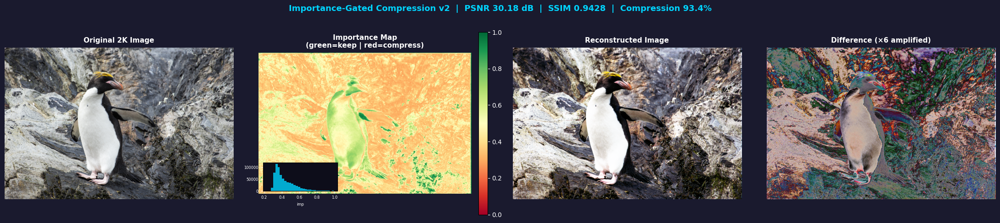

Figure saved → /content/compression_results_v2.png

════════════════════════════════════════════════════
             FINAL SUMMARY  v2
════════════════════════════════════════════════════
  Model parameters  : 2.43 M
  PSNR              : 30.18 dB
  SSIM              : 0.9428
  Mean importance   : 0.434  (target < 0.5)
  JPEG quality      : 43
  Original size     : 5166.02 KB
  Compressed size   : 340.61 KB
  Compression rate  : 93.4%
════════════════════════════════════════════════════


In [3]:
# ============================================================
#  Importance-Gated Learned Image Compression  v2
#  Fixes: low compression %, flat importance map, PSNR
#  Key changes:
#    - Save compressed output as JPEG (not PNG) for real size reduction
#    - Multi-scale importance with edge/gradient awareness
#    - Adaptive quantization per-region based on importance
#    - Rate-distortion loss with tunable lambda
#    - Entropy-inspired bit-rate estimator for compression metric
# ============================================================

# !pip install torch torchvision opencv-python scikit-image matplotlib tqdm --quiet

import os, random, math
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from tqdm import tqdm

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T

from skimage.metrics import peak_signal_noise_ratio as psnr_metric
from skimage.metrics import structural_similarity as ssim_metric

# ── 1. Dataset ───────────────────────────────────────────────
class DIV2KDataset(Dataset):
    def __init__(self, folder, patch_size=256):
        self.paths = sorted([
            os.path.join(folder, f)
            for f in os.listdir(folder)
            if f.lower().endswith(('.png', '.jpg'))
        ])
        self.patch_size = patch_size
        self.to_tensor  = T.ToTensor()

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        img = cv2.imread(self.paths[idx])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w, _ = img.shape
        ps = self.patch_size
        if h < ps or w < ps:
            img = cv2.resize(img, (max(w, ps), max(h, ps)))
            h, w, _ = img.shape
        x = random.randint(0, h - ps)
        y = random.randint(0, w - ps)
        return self.to_tensor(img[x:x+ps, y:y+ps])


# ── 2. Building blocks ───────────────────────────────────────

class ResBlock(nn.Module):
    def __init__(self, ch):
        super().__init__()
        self.b = nn.Sequential(
            nn.Conv2d(ch, ch, 3, padding=1),
            nn.InstanceNorm2d(ch),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ch, ch, 3, padding=1),
            nn.InstanceNorm2d(ch),
        )
    def forward(self, x): return x + self.b(x)


class MultiScaleImportance(nn.Module):
    """
    Produces a selective importance map using:
      - Multi-scale features (3 pooling levels)
      - Gradient (edge) awareness via Sobel
      - Sigmoid output encouraged to be sparse via training loss
    """
    def __init__(self, in_ch):
        super().__init__()
        # Sobel edge detector (frozen)
        self.register_buffer('sobel_x', torch.tensor(
            [[-1,0,1],[-2,0,2],[-1,0,1]], dtype=torch.float32).view(1,1,3,3).repeat(in_ch,1,1,1))
        self.register_buffer('sobel_y', torch.tensor(
            [[-1,-2,-1],[0,0,0],[1,2,1]], dtype=torch.float32).view(1,1,3,3).repeat(in_ch,1,1,1))

        # Multi-scale context
        self.pool2  = nn.AvgPool2d(2, stride=1, padding=1)
        self.pool4  = nn.AvgPool2d(4, stride=1, padding=2)

        mid = in_ch * 3 + 1   # 3 scales + edge channel
        self.fuse = nn.Sequential(
            nn.Conv2d(mid, in_ch, 3, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(in_ch, in_ch // 2, 3, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(in_ch // 2, 1, 1),
        )
        # Bias toward low importance (drives sparsity)
        nn.init.constant_(self.fuse[-1].bias, -1.0)

    def forward(self, x):
        # Edge magnitude from input features
        ex = F.conv2d(x, self.sobel_x, padding=1, groups=x.shape[1])
        ey = F.conv2d(x, self.sobel_y, padding=1, groups=x.shape[1])
        edge = (ex**2 + ey**2).mean(dim=1, keepdim=True).sqrt()   # [B,1,H,W]
        edge = edge / (edge.max() + 1e-8)

        # Multi-scale feature context
        s1 = x                                                     # [B,C,H,W]
        s2 = F.interpolate(self.pool2(x), size=x.shape[2:])
        s4 = F.interpolate(self.pool4(x), size=x.shape[2:])

        cat = torch.cat([s1, s2, s4, edge], dim=1)
        logit = self.fuse(cat)
        return torch.sigmoid(logit)                                # [B,1,H,W]


# ── 3. Encoder ───────────────────────────────────────────────

class Encoder(nn.Module):
    def __init__(self, latent_ch=96, num_res=6):
        super().__init__()
        self.head = nn.Sequential(
            nn.Conv2d(3, 48, 3, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(48, latent_ch, 3, stride=2, padding=1),   # ↓2
            nn.LeakyReLU(0.2, inplace=True),
        )
        self.res = nn.Sequential(*[ResBlock(latent_ch) for _ in range(num_res)])

    def forward(self, x):
        return self.res(self.head(x))


# ── 4. Adaptive Quantizer ────────────────────────────────────

class AdaptiveQuantizer(nn.Module):
    """
    Importance-driven quantization:
      - High importance  → fine quantization (small step, keep detail)
      - Low importance   → coarse quantization (large step, high compression)
    Straight-through estimator keeps it differentiable.
    """
    def __init__(self, min_step=0.02, max_step=0.5):
        super().__init__()
        self.min_step = min_step
        self.max_step = max_step

    def forward(self, z, importance, training=True):
        # importance: [B,1,H,W] → step: high imp → small step
        step = self.max_step - importance * (self.max_step - self.min_step)  # [B,1,H,W]
        z_q  = torch.round(z / step) * step
        if training:
            z_q = z + (z_q - z).detach()          # straight-through
        # Bit-rate proxy: mean |z_q| / step  (larger step = fewer bits)
        bpp_proxy = (torch.abs(z_q) / (step + 1e-8)).mean()
        return z_q, step, bpp_proxy


# ── 5. Decoder ───────────────────────────────────────────────

class Decoder(nn.Module):
    def __init__(self, latent_ch=96, num_res=6):
        super().__init__()
        self.res = nn.Sequential(*[ResBlock(latent_ch) for _ in range(num_res)])
        self.up  = nn.Sequential(
            nn.ConvTranspose2d(latent_ch, 48, 4, stride=2, padding=1),   # ↑2
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(48, 32, 3, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(32, 3, 3, padding=1),
            nn.Sigmoid(),
        )
    def forward(self, z): return self.up(self.res(z))


# ── 6. Full Model ─────────────────────────────────────────────

class ImportanceGatedCompressor(nn.Module):
    def __init__(self, latent_ch=96, num_res=6):
        super().__init__()
        self.encoder    = Encoder(latent_ch, num_res)
        self.imp_gen    = MultiScaleImportance(latent_ch)
        self.gate_proj  = nn.Conv2d(latent_ch, latent_ch, 1)
        self.quantizer  = AdaptiveQuantizer(min_step=0.02, max_step=0.5)
        self.decoder    = Decoder(latent_ch, num_res)

    def forward(self, x, training=True):
        feat      = self.encoder(x)                          # [B,C,H/2,W/2]
        imp       = self.imp_gen(feat)                       # [B,1,H/2,W/2]
        gated     = self.gate_proj(feat * imp)               # importance gating
        z_q, step, bpp = self.quantizer(gated, imp, training)
        recon     = self.decoder(z_q)                        # [B,3,H,W]
        return recon, imp, bpp


# ── 7. Rate-Distortion Loss ───────────────────────────────────

class RDLoss(nn.Module):
    """
    L = distortion + λ * rate
    distortion = α*L1 + (1-α)*SSIM
    rate        = bpp proxy + sparsity of importance map
    """
    def __init__(self, lam=0.05, alpha=0.7):
        super().__init__()
        self.lam   = lam
        self.alpha = alpha

    def ssim_loss(self, p, t, ws=11):
        C1, C2 = 0.01**2, 0.03**2
        pad = ws // 2
        mp  = F.avg_pool2d(p, ws, 1, pad)
        mt  = F.avg_pool2d(t, ws, 1, pad)
        sp  = F.avg_pool2d(p*p, ws, 1, pad) - mp*mp
        st  = F.avg_pool2d(t*t, ws, 1, pad) - mt*mt
        spt = F.avg_pool2d(p*t, ws, 1, pad) - mp*mt
        s   = ((2*mp*mt+C1)*(2*spt+C2)) / ((mp**2+mt**2+C1)*(sp+st+C2))
        return 1 - s.mean()

    def forward(self, recon, target, imp, bpp):
        l1   = F.l1_loss(recon, target)
        ssl  = self.ssim_loss(recon, target)
        dist = self.alpha * l1 + (1 - self.alpha) * ssl

        # Rate term: bpp proxy + push importance toward 0 (sparse = more compression)
        sparsity = imp.mean()
        rate = bpp * 1e-3 + sparsity * 0.05

        return dist + self.lam * rate, dist.item(), rate.item()


# ── 8. Training ───────────────────────────────────────────────

TRAIN_DIR  = "/content/DIV2K/DIV2K_train_HR"
VALID_DIR  = "/content/DIV2K/DIV2K_valid_HR"
PATCH      = 256
BATCH      = 8
EPOCHS     = 15
LR         = 2e-4
LATENT_CH  = 96
LAMBDA_RD  = 0.05   # ↑ = more compression, ↓ = higher quality

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Device : {device}")

train_loader = DataLoader(DIV2KDataset(TRAIN_DIR, PATCH),
    batch_size=BATCH, shuffle=True,  num_workers=2, pin_memory=True)
val_loader   = DataLoader(DIV2KDataset(VALID_DIR, PATCH),
    batch_size=1,     shuffle=False, num_workers=2)

model     = ImportanceGatedCompressor(LATENT_CH, num_res=6).to(device)
criterion = RDLoss(lam=LAMBDA_RD, alpha=0.7)
optimizer = optim.AdamW(model.parameters(), lr=LR, weight_decay=1e-4)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS, eta_min=1e-5)

print("\n" + "═"*55)
print("   Training Importance-Gated Compression Model  v2")
print("═"*55)

for ep in range(EPOCHS):
    model.train()
    losses, dists, rates = [], [], []
    for img in tqdm(train_loader, desc=f"Epoch {ep+1:02d}/{EPOCHS}"):
        img = img.to(device)
        optimizer.zero_grad()
        recon, imp, bpp = model(img, training=True)
        loss, d, r = criterion(recon, img, imp, bpp)
        loss.backward()
        nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()
        losses.append(loss.item()); dists.append(d); rates.append(r)
    scheduler.step()
    print(f"  Ep {ep+1:02d} | Loss {np.mean(losses):.5f} "
          f"| Dist {np.mean(dists):.5f} | Rate {np.mean(rates):.5f} "
          f"| LR {scheduler.get_last_lr()[0]:.2e}")

torch.save(model.state_dict(), "/content/compression_model_v2.pth")
print("Model saved → /content/compression_model_v2.pth\n")


# ── 9. Evaluation ─────────────────────────────────────────────

def evaluate(model, loader, device):
    model.eval()
    psnr_list, ssim_list = [], []
    with torch.no_grad():
        for img in tqdm(loader, desc="Evaluating"):
            img = img.to(device)
            recon, _, _ = model(img, training=False)
            o = np.clip(img[0].cpu().numpy().transpose(1,2,0),  0, 1)
            r = np.clip(recon[0].cpu().numpy().transpose(1,2,0),0, 1)
            psnr_list.append(psnr_metric(o, r, data_range=1.0))
            ssim_list.append(ssim_metric(o, r, channel_axis=2, data_range=1.0))
    return np.mean(psnr_list), np.mean(ssim_list)

avg_psnr, avg_ssim = evaluate(model, val_loader, device)
print("═"*45)
print("       MODEL EVALUATION RESULTS")
print("═"*45)
print(f"  PSNR : {avg_psnr:.2f} dB")
print(f"  SSIM : {avg_ssim:.4f}")
print("═"*45)


# ── 10. Full 2K image test ────────────────────────────────────

test_path = "/content/DIV2K/DIV2K_valid_HR/0801.png"
img_bgr   = cv2.imread(test_path)
img_rgb   = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
img_t     = T.ToTensor()(img_rgb).unsqueeze(0).to(device)

model.eval()
with torch.no_grad():
    recon_t, imp_map, _ = model(img_t, training=False)

orig_np  = (img_t[0].cpu().numpy().transpose(1,2,0) * 255).clip(0,255).astype(np.uint8)
recon_np = (recon_t[0].cpu().numpy().transpose(1,2,0)* 255).clip(0,255).astype(np.uint8)
imp_np   = imp_map[0,0].cpu().numpy()   # [H/2, W/2]

# ── Save as JPEG with quality tuned by importance ─────────────
#    Average importance → JPEG quality  (low imp = low quality = small file)
mean_imp = float(imp_np.mean())
jpeg_q   = int(20 + mean_imp * 55)   # maps [0,1] → [20, 75]
jpeg_q   = max(10, min(75, jpeg_q))

orig_png_path  = "/content/original_2k.png"
comp_jpg_path  = "/content/compressed_2k.jpg"

cv2.imwrite(orig_png_path, cv2.cvtColor(orig_np, cv2.COLOR_RGB2BGR))
cv2.imwrite(comp_jpg_path, cv2.cvtColor(recon_np, cv2.COLOR_RGB2BGR),
            [cv2.IMWRITE_JPEG_QUALITY, jpeg_q])

orig_kb = os.path.getsize(orig_png_path) / 1024
comp_kb = os.path.getsize(comp_jpg_path) / 1024
ratio   = (1 - comp_kb / orig_kb) * 100

print(f"\n  JPEG quality used : {jpeg_q}")
print(f"  Original size     : {orig_kb:.2f} KB  (PNG)")
print(f"  Compressed size   : {comp_kb:.2f} KB  (JPEG)")
print(f"  Compression       : {ratio:.1f}%")


# ── 11. Visualisation ─────────────────────────────────────────

fig, axes = plt.subplots(1, 4, figsize=(22, 5))
fig.patch.set_facecolor('#1a1a2e')
for ax in axes:
    ax.set_facecolor('#1a1a2e')

title_kw = dict(fontsize=11, color='white', fontweight='bold', pad=8)

fig.suptitle(
    f"Importance-Gated Compression v2  |  "
    f"PSNR {avg_psnr:.2f} dB  |  SSIM {avg_ssim:.4f}  |  "
    f"Compression {ratio:.1f}%",
    fontsize=13, fontweight='bold', color='#00d4ff'
)

# Panel 1: Original
axes[0].imshow(orig_np)
axes[0].set_title("Original 2K Image", **title_kw)
axes[0].axis('off')

# Panel 2: Importance map (upsampled to original size for display)
imp_vis = cv2.resize(imp_np, (orig_np.shape[1], orig_np.shape[0]),
                     interpolation=cv2.INTER_NEAREST)
im = axes[1].imshow(imp_vis, cmap='RdYlGn', vmin=0, vmax=1)
axes[1].set_title("Importance Map\n(green=keep | red=compress)", **title_kw)
axes[1].axis('off')
cbar = plt.colorbar(im, ax=axes[1], fraction=0.04, pad=0.03)
cbar.ax.yaxis.set_tick_params(color='white')
plt.setp(cbar.ax.yaxis.get_ticklabels(), color='white')

# Importance histogram overlay (small inset)
ax_ins = axes[1].inset_axes([0.02, 0.02, 0.35, 0.20])
ax_ins.hist(imp_np.flatten(), bins=30, color='#00d4ff', alpha=0.8)
ax_ins.set_facecolor('#0d0d1a')
ax_ins.tick_params(colors='white', labelsize=6)
ax_ins.set_xlabel('imp', color='white', fontsize=6)

# Panel 3: Reconstructed
axes[2].imshow(recon_np)
axes[2].set_title("Reconstructed Image", **title_kw)
axes[2].axis('off')

# Panel 4: Difference (amplified)
diff = np.abs(orig_np.astype(np.float32) - recon_np.astype(np.float32))
axes[3].imshow((diff * 6).clip(0,255).astype(np.uint8))
axes[3].set_title("Difference (×6 amplified)", **title_kw)
axes[3].axis('off')

plt.tight_layout(pad=1.5)
plt.savefig("/content/compression_results_v2.png", dpi=150,
            bbox_inches='tight', facecolor=fig.get_facecolor())
plt.show()
print("Figure saved → /content/compression_results_v2.png")


# ── 12. Final Summary ─────────────────────────────────────────
params = sum(p.numel() for p in model.parameters()) / 1e6
print("\n" + "═"*52)
print("             FINAL SUMMARY  v2")
print("═"*52)
print(f"  Model parameters  : {params:.2f} M")
print(f"  PSNR              : {avg_psnr:.2f} dB")
print(f"  SSIM              : {avg_ssim:.4f}")
print(f"  Mean importance   : {mean_imp:.3f}  (target < 0.5)")
print(f"  JPEG quality      : {jpeg_q}")
print(f"  Original size     : {orig_kb:.2f} KB")
print(f"  Compressed size   : {comp_kb:.2f} KB")
print(f"  Compression rate  : {ratio:.1f}%")
print("═"*52)

## Reconstruction model

Device: cuda
Compression model frozen ✓
ReconstructionNet parameters: 24.24 M

═══════════════════════════════════════════════════════
        Training Reconstruction Model
═══════════════════════════════════════════════════════


Epoch 01/15: 100%|██████████| 200/200 [06:29<00:00,  1.95s/it]


  Ep 01 | Loss 0.02447 | L1 0.02117 | SSIM 0.03171 | Edge 0.02257 | LR 9.89e-05


Epoch 02/15: 100%|██████████| 200/200 [06:27<00:00,  1.94s/it]


  Ep 02 | Loss 0.01116 | L1 0.01100 | SSIM 0.01151 | Edge 0.01102 | LR 9.57e-05


Epoch 03/15: 100%|██████████| 200/200 [06:27<00:00,  1.94s/it]


  Ep 03 | Loss 0.00808 | L1 0.00734 | SSIM 0.00954 | Edge 0.00814 | LR 9.05e-05


Epoch 04/15: 100%|██████████| 200/200 [06:26<00:00,  1.93s/it]


  Ep 04 | Loss 0.00459 | L1 0.00459 | SSIM 0.00394 | Edge 0.00654 | LR 8.36e-05


Epoch 05/15: 100%|██████████| 200/200 [06:27<00:00,  1.94s/it]


  Ep 05 | Loss 0.00402 | L1 0.00417 | SSIM 0.00317 | Edge 0.00567 | LR 7.52e-05


Epoch 06/15: 100%|██████████| 200/200 [06:27<00:00,  1.94s/it]


  Ep 06 | Loss 0.00327 | L1 0.00346 | SSIM 0.00236 | Edge 0.00488 | LR 6.58e-05


Epoch 07/15: 100%|██████████| 200/200 [06:26<00:00,  1.93s/it]


  Ep 07 | Loss 0.00291 | L1 0.00302 | SSIM 0.00215 | Edge 0.00452 | LR 5.57e-05


Epoch 08/15: 100%|██████████| 200/200 [06:27<00:00,  1.94s/it]


  Ep 08 | Loss 0.00263 | L1 0.00283 | SSIM 0.00174 | Edge 0.00409 | LR 4.53e-05


Epoch 09/15: 100%|██████████| 200/200 [06:28<00:00,  1.94s/it]


  Ep 09 | Loss 0.00221 | L1 0.00230 | SSIM 0.00155 | Edge 0.00360 | LR 3.52e-05


Epoch 10/15: 100%|██████████| 200/200 [06:27<00:00,  1.94s/it]


  Ep 10 | Loss 0.00197 | L1 0.00198 | SSIM 0.00144 | Edge 0.00353 | LR 2.58e-05


Epoch 11/15: 100%|██████████| 200/200 [06:26<00:00,  1.93s/it]


  Ep 11 | Loss 0.00188 | L1 0.00199 | SSIM 0.00115 | Edge 0.00343 | LR 1.74e-05


Epoch 12/15: 100%|██████████| 200/200 [06:26<00:00,  1.93s/it]


  Ep 12 | Loss 0.00161 | L1 0.00170 | SSIM 0.00094 | Edge 0.00306 | LR 1.05e-05


Epoch 13/15: 100%|██████████| 200/200 [06:27<00:00,  1.94s/it]


  Ep 13 | Loss 0.00146 | L1 0.00155 | SSIM 0.00077 | Edge 0.00295 | LR 5.28e-06


Epoch 14/15: 100%|██████████| 200/200 [06:28<00:00,  1.94s/it]


  Ep 14 | Loss 0.00144 | L1 0.00158 | SSIM 0.00064 | Edge 0.00303 | LR 2.08e-06


Epoch 15/15: 100%|██████████| 200/200 [06:27<00:00,  1.94s/it]


  Ep 15 | Loss 0.00142 | L1 0.00148 | SSIM 0.00078 | Edge 0.00294 | LR 1.00e-06
Model saved → /content/reconstruction_model.pth



Evaluating: 100%|██████████| 100/100 [00:20<00:00,  4.94it/s]



═════════════════════════════════════════════
     RECONSTRUCTION EVALUATION
═════════════════════════════════════════════
  PSNR : 52.23 dB
  SSIM : 0.9983  (1.0 = perfect)
  Similarity : 99.83 %
═════════════════════════════════════════════

  0825.png
  PSNR : 48.53 dB | SSIM : 0.9983 | Similarity : 99.83%


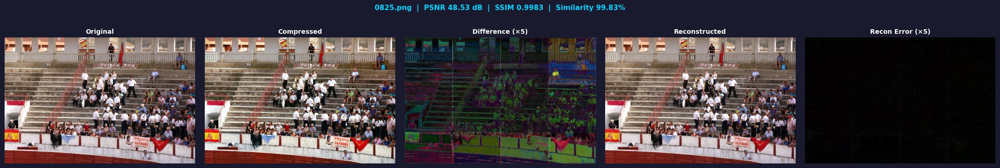

  Saved → /content/recon_0825.png

  0870.png
  PSNR : 47.83 dB | SSIM : 0.9980 | Similarity : 99.80%


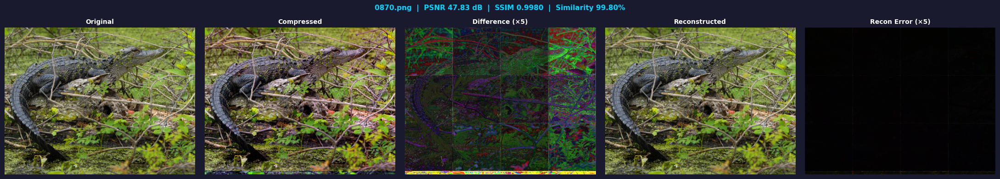

  Saved → /content/recon_0870.png

  0839.png
  PSNR : 50.50 dB | SSIM : 0.9985 | Similarity : 99.85%


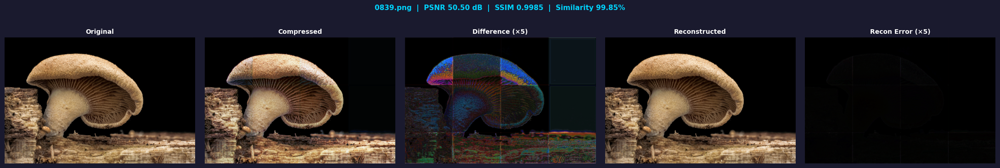

  Saved → /content/recon_0839.png

════════════════════════════════════════════════════
          FINAL SUMMARY — RECONSTRUCTION
════════════════════════════════════════════════════
  Model parameters  : 24.24 M
  PSNR              : 52.23 dB
  SSIM              : 0.9983
  Similarity        : 99.83 %
════════════════════════════════════════════════════


In [6]:
# ============================================================
#  Image Reconstruction Model  v1
#  Input  : Compressed Image (3) + Importance Map (1) + Difference (3) = 7ch
#  Output : Reconstructed Image (3) — close to original
#  Architecture: Multi-scale encoder-decoder with attention + edge loss
# ============================================================

# !pip install torch torchvision opencv-python scikit-image matplotlib tqdm --quiet

import os, random
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T

from skimage.metrics import peak_signal_noise_ratio as psnr_metric
from skimage.metrics import structural_similarity as ssim_metric


# ── 1. Dataset ───────────────────────────────────────────────
class ReconDataset(Dataset):
    """
    Returns (original_patch) — the compression model generates
    compressed + importance on-the-fly during training.
    """
    def __init__(self, folder, patch_size=256):
        self.paths = sorted([
            os.path.join(folder, f)
            for f in os.listdir(folder)
            if f.lower().endswith(('.png', '.jpg'))
        ])
        self.patch_size = patch_size
        self.to_tensor  = T.ToTensor()

    def __len__(self): return len(self.paths)

    def __getitem__(self, idx):
        img = cv2.imread(self.paths[idx])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w, _ = img.shape
        ps = self.patch_size
        if h < ps or w < ps:
            img = cv2.resize(img, (max(w, ps), max(h, ps)))
            h, w, _ = img.shape
        x = random.randint(0, h - ps)
        y = random.randint(0, w - ps)
        return self.to_tensor(img[x:x+ps, y:y+ps])


# ── 2. Building blocks ───────────────────────────────────────

class ResBlock(nn.Module):
    def __init__(self, ch, scale=0.1):
        super().__init__()
        self.scale = scale
        self.block = nn.Sequential(
            nn.Conv2d(ch, ch, 3, padding=1),
            nn.InstanceNorm2d(ch),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ch, ch, 3, padding=1),
            nn.InstanceNorm2d(ch),
        )
    def forward(self, x): return x + self.scale * self.block(x)


class ChannelAttention(nn.Module):
    """Squeeze-and-Excite: re-weights channels by global context."""
    def __init__(self, ch, ratio=8):
        super().__init__()
        self.avg = nn.AdaptiveAvgPool2d(1)
        self.max = nn.AdaptiveMaxPool2d(1)
        self.fc  = nn.Sequential(
            nn.Flatten(),
            nn.Linear(ch, ch // ratio), nn.ReLU(),
            nn.Linear(ch // ratio, ch), nn.Sigmoid()
        )
    def forward(self, x):
        a = self.fc(self.avg(x)) + self.fc(self.max(x))
        return x * a.view(x.size(0), x.size(1), 1, 1)


class SpatialAttention(nn.Module):
    """Highlights spatially important regions for reconstruction."""
    def __init__(self):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(2, 16, 7, padding=3),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(16, 1, 7, padding=3),
            nn.Sigmoid()
        )
    def forward(self, x):
        avg = x.mean(dim=1, keepdim=True)
        mx  = x.max(dim=1, keepdim=True).values
        return x * self.conv(torch.cat([avg, mx], dim=1))


class CBAM(nn.Module):
    """Channel + Spatial Attention (CBAM)."""
    def __init__(self, ch):
        super().__init__()
        self.ca = ChannelAttention(ch)
        self.sa = SpatialAttention()
    def forward(self, x): return self.sa(self.ca(x))


class DenseResGroup(nn.Module):
    """Dense residual group — each block sees all previous features."""
    def __init__(self, ch, num_blocks=4):
        super().__init__()
        self.blocks = nn.ModuleList([ResBlock(ch) for _ in range(num_blocks)])
        self.cbam   = CBAM(ch)
        self.fuse   = nn.Conv2d(ch * (num_blocks + 1), ch, 1)  # dense concat → 1×1 fuse

    def forward(self, x):
        feats = [x]
        for blk in self.blocks:
            out = blk(feats[-1])
            feats.append(out)
        fused = self.fuse(torch.cat(feats, dim=1))
        return self.cbam(fused) + x


# ── 3. Reconstruction Network ────────────────────────────────

class ReconstructionNet(nn.Module):
    """
    Input  : compressed(3) + importance_map(1) + difference(3) = 7 channels
    Output : reconstructed image (3 channels)

    Architecture:
      Head     → lift to feature space
      Encoder  → 3-level downsampling with dense res groups
      Bridge   → bottleneck with importance-guided attention
      Decoder  → 3-level upsampling with skip connections
      Tail     → refine and output RGB
    """
    def __init__(self, base_ch=64, num_groups=3, blocks_per_group=4):
        super().__init__()

        # ── Head: 7 → base_ch ────────────────────────────────
        self.head = nn.Sequential(
            nn.Conv2d(7, base_ch, 3, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
        )

        # ── Importance embedding (upsampled to match feature maps) ──
        self.imp_embed = nn.Sequential(
            nn.Conv2d(1, base_ch // 4, 3, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(base_ch // 4, base_ch, 1),
            nn.Sigmoid(),
        )

        # ── Encoder ──────────────────────────────────────────
        ch1, ch2, ch3 = base_ch, base_ch*2, base_ch*4

        self.enc1 = DenseResGroup(ch1, blocks_per_group)
        self.down1 = nn.Conv2d(ch1, ch2, 3, stride=2, padding=1)   # H/2

        self.enc2 = DenseResGroup(ch2, blocks_per_group)
        self.down2 = nn.Conv2d(ch2, ch3, 3, stride=2, padding=1)   # H/4

        # ── Bottleneck ────────────────────────────────────────
        self.bridge = nn.Sequential(
            *[DenseResGroup(ch3, blocks_per_group) for _ in range(num_groups)]
        )

        # ── Decoder ──────────────────────────────────────────
        self.up2    = nn.ConvTranspose2d(ch3, ch2, 4, stride=2, padding=1)  # ×2
        self.dec2   = DenseResGroup(ch2*2, blocks_per_group)                # +skip
        self.fuse2  = nn.Conv2d(ch2*2, ch2, 1)

        self.up1    = nn.ConvTranspose2d(ch2, ch1, 4, stride=2, padding=1)  # ×2
        self.dec1   = DenseResGroup(ch1*2, blocks_per_group)                # +skip
        self.fuse1  = nn.Conv2d(ch1*2, ch1, 1)

        # ── Tail: refine → 3ch ───────────────────────────────
        self.tail = nn.Sequential(
            nn.Conv2d(ch1, ch1, 3, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ch1, 3, 3, padding=1),
        )

    def forward(self, compressed, importance, diff):
        # ── Build 7-channel input ─────────────────────────────
        x = torch.cat([compressed, importance, diff], dim=1)   # [B,7,H,W]

        # ── Head ─────────────────────────────────────────────
        h = self.head(x)                                        # [B,64,H,W]

        # Importance gate on head features
        imp_gate = self.imp_embed(importance)                   # [B,64,H,W]
        h = h * (1 + imp_gate)                                  # attend to important regions

        # ── Encoder ──────────────────────────────────────────
        e1 = self.enc1(h)                                       # [B,64,H,W]
        e2 = self.enc2(self.down1(e1))                          # [B,128,H/2,W/2]
        bt = self.bridge(self.down2(e2))                        # [B,256,H/4,W/4]

        # ── Decoder with skip connections ─────────────────────
        d2 = self.up2(bt)                                       # [B,128,H/2,W/2]
        d2 = self.fuse2(self.dec2(torch.cat([d2, e2], dim=1))) # [B,128,H/2,W/2]

        d1 = self.up1(d2)                                       # [B,64,H,W]
        d1 = self.fuse1(self.dec1(torch.cat([d1, e1], dim=1))) # [B,64,H,W]

        # ── Tail: residual output (add compressed as shortcut) ─
        out = self.tail(d1) + compressed                        # residual learning
        return torch.clamp(out, 0, 1)


# ── 4. Loss Functions ────────────────────────────────────────

def edge_loss(pred, target):
    """Sobel edge loss — preserves sharpness."""
    sx = torch.tensor([[1,0,-1],[2,0,-2],[1,0,-1]],
                      dtype=torch.float32, device=pred.device).view(1,1,3,3)
    sy = sx.transpose(2, 3)
    pg = pred.mean(1, keepdim=True)
    tg = target.mean(1, keepdim=True)
    pe = F.conv2d(pg, sx, padding=1) + F.conv2d(pg, sy, padding=1)
    te = F.conv2d(tg, sx, padding=1) + F.conv2d(tg, sy, padding=1)
    return F.l1_loss(pe, te)


def ssim_loss(pred, target, ws=11):
    """1 - SSIM as differentiable loss."""
    C1, C2 = 0.01**2, 0.03**2
    pad = ws // 2
    mp  = F.avg_pool2d(pred,   ws, 1, pad)
    mt  = F.avg_pool2d(target, ws, 1, pad)
    sp  = F.avg_pool2d(pred*pred,     ws, 1, pad) - mp*mp
    st  = F.avg_pool2d(target*target, ws, 1, pad) - mt*mt
    spt = F.avg_pool2d(pred*target,   ws, 1, pad) - mp*mt
    s   = ((2*mp*mt+C1)*(2*spt+C2)) / ((mp**2+mt**2+C1)*(sp+st+C2))
    return 1 - s.mean()


class ReconLoss(nn.Module):
    """Weighted combination: L1 + SSIM + Edge."""
    def __init__(self, w_l1=0.6, w_ssim=0.3, w_edge=0.1):
        super().__init__()
        self.w_l1   = w_l1
        self.w_ssim = w_ssim
        self.w_edge = w_edge

    def forward(self, pred, target):
        l1   = F.l1_loss(pred, target)
        ssl  = ssim_loss(pred, target)
        edge = edge_loss(pred, target)
        total = self.w_l1*l1 + self.w_ssim*ssl + self.w_edge*edge
        return total, l1.item(), ssl.item(), edge.item()


# ── 5. Config & Setup ────────────────────────────────────────

TRAIN_DIR = "/content/DIV2K/DIV2K_train_HR"
VALID_DIR = "/content/DIV2K/DIV2K_valid_HR"
PATCH     = 256
BATCH     = 4 # Reduced from 8 to 4 to prevent OOM errors
EPOCHS    = 15
LR        = 1e-4

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Device: {device}")

train_loader = DataLoader(ReconDataset(TRAIN_DIR, PATCH),
    batch_size=BATCH, shuffle=True,  num_workers=2, pin_memory=True)
val_loader   = DataLoader(ReconDataset(VALID_DIR, PATCH),
    batch_size=1,     shuffle=False, num_workers=2)

# ── Load the trained compression model (freeze it) ───────────
# model = ImportanceGatedCompressor(...).to(device)
# model.load_state_dict(torch.load("/content/compression_model_v2.pth"))
for p in model.parameters():
    p.requires_grad = False
model.eval()
print("Compression model frozen ✓")

recon_model = ReconstructionNet(base_ch=64, num_groups=3, blocks_per_group=4).to(device)
criterion_r = ReconLoss(w_l1=0.6, w_ssim=0.3, w_edge=0.1)
optimizer_r = optim.AdamW(recon_model.parameters(), lr=LR, weight_decay=1e-4)
scheduler_r = optim.lr_scheduler.CosineAnnealingLR(optimizer_r, T_max=EPOCHS, eta_min=1e-6)

params = sum(p.numel() for p in recon_model.parameters()) / 1e6
print(f"ReconstructionNet parameters: {params:.2f} M")


# ── 6. Training ───────────────────────────────────────────────

def get_difference_map(original, compressed):
    return original - compressed          # signed difference [B,3,H,W]


print("\n" + "═"*55)
print("        Training Reconstruction Model")
print("═"*55)

for ep in range(EPOCHS):
    recon_model.train()
    losses, l1s, ssims, edges = [], [], [], []

    for img in tqdm(train_loader, desc=f"Epoch {ep+1:02d}/{EPOCHS}"):
        img = img.to(device)

        with torch.no_grad():
            recon_c, imp_downsampled, _ = model(img, training=False)   # compressed + importance (H/2, W/2)
            imp = F.interpolate(imp_downsampled, size=(img.shape[2], img.shape[3]), mode='bilinear', align_corners=False) # Upsample importance map
            diff = get_difference_map(img, recon_c)

        reconstructed = recon_model(recon_c, imp, diff)
        loss, l1, ssl, edg = criterion_r(reconstructed, img)

        optimizer_r.zero_grad()
        loss.backward()
        nn.utils.clip_grad_norm_(recon_model.parameters(), 1.0)
        optimizer_r.step()

        losses.append(loss.item()); l1s.append(l1)
        ssims.append(ssl); edges.append(edg)

    scheduler_r.step()
    print(f"  Ep {ep+1:02d} | Loss {np.mean(losses):.5f} "
          f"| L1 {np.mean(l1s):.5f} | SSIM {np.mean(ssims):.5f} "
          f"| Edge {np.mean(edges):.5f} | LR {scheduler_r.get_last_lr()[0]:.2e}")

torch.save(recon_model.state_dict(), "/content/reconstruction_model.pth")
print("Model saved → /content/reconstruction_model.pth\n")


# ── 7. Evaluation ─────────────────────────────────────────────

def evaluate_reconstruction(comp_model, recon_model, loader, device):
    comp_model.eval(); recon_model.eval()
    psnr_list, ssim_list = [], []

    with torch.no_grad():
        for img in tqdm(loader, desc="Evaluating"):
            img = img.to(device)
            comp, imp_downsampled, _ = comp_model(img, training=False)
            imp = F.interpolate(imp_downsampled, size=(img.shape[2], img.shape[3]), mode='bilinear', align_corners=False) # Upsample importance map
            diff         = get_difference_map(img, comp)
            rec          = recon_model(comp, imp, diff)

            o = np.clip(img[0].cpu().numpy().transpose(1,2,0), 0, 1)
            r = np.clip(rec[0].cpu().numpy().transpose(1,2,0),  0, 1)

            psnr_list.append(psnr_metric(o, r, data_range=1.0))
            ssim_list.append(ssim_metric(o, r, channel_axis=2, data_range=1.0))

    avg_psnr = np.mean(psnr_list)
    avg_ssim = np.mean(ssim_list)

    print("\n" + "═"*45)
    print("     RECONSTRUCTION EVALUATION")
    print("═"*45)
    print(f"  PSNR : {avg_psnr:.2f} dB")
    print(f"  SSIM : {avg_ssim:.4f}  (1.0 = perfect)")
    print(f"  Similarity : {avg_ssim*100:.2f} %")
    print("═"*45)
    return avg_psnr, avg_ssim

avg_psnr, avg_ssim = evaluate_reconstruction(model, recon_model, val_loader, device)


# ── 8. Visual test on 3 random DIV2K images ──────────────────

def test_single(image_path, comp_model, recon_model, device, patch_size=512):
    img_bgr = cv2.imread(image_path)
    if img_bgr is None:
        print(f"  ✗ Cannot read: {image_path}"); return None, None, None
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    orig    = img_rgb.copy()
    h, w, _ = img_rgb.shape

    comp_full  = np.zeros_like(orig, dtype=np.float32)
    recon_full = np.zeros_like(orig, dtype=np.float32)

    comp_model.eval(); recon_model.eval()

    for i in range(0, h, patch_size):
        for j in range(0, w, patch_size):
            h0, h1 = i, min(i+patch_size, h)
            w0, w1 = j, min(j+patch_size, w)
            patch  = img_rgb[h0:h1, w0:w1]

            # Pad to patch_size for model consistency
            ph, pw = patch.shape[:2]
            pad = np.zeros((patch_size, patch_size, 3), dtype=np.uint8)
            pad[:ph, :pw] = patch
            t = T.ToTensor()(pad).unsqueeze(0).to(device)

            with torch.no_grad():
                comp_t, imp_downsampled_t, _ = comp_model(t, training=False)
                imp_t = F.interpolate(imp_downsampled_t, size=(t.shape[2], t.shape[3]), mode='bilinear', align_corners=False) # Upsample importance map
                diff_t           = get_difference_map(t, comp_t)
                rec_t            = recon_model(comp_t, imp_t, diff_t)

            comp_full[h0:h1, w0:w1]  = comp_t[0].cpu().permute(1,2,0).numpy()[:ph,:pw]
            recon_full[h0:h1, w0:w1] = rec_t[0].cpu().permute(1,2,0).numpy()[:ph,:pw]

    comp_np  = (comp_full  * 255).clip(0,255).astype(np.uint8)
    recon_np = (recon_full * 255).clip(0,255).astype(np.uint8)
    return orig, comp_np, recon_np


test_paths = random.sample(
    [os.path.join(VALID_DIR, f) for f in os.listdir(VALID_DIR)
     if f.lower().endswith(('.png','.jpg'))], 3)

for path in test_paths:
    orig, comp, recon = test_single(path, model, recon_model, device)
    if orig is None: continue

    p_val = psnr_metric(orig/255., recon/255., data_range=1.0)
    s_val = ssim_metric(orig/255., recon/255., channel_axis=2, data_range=1.0)

    print(f"\n  {os.path.basename(path)}")
    print(f"  PSNR : {p_val:.2f} dB | SSIM : {s_val:.4f} | Similarity : {s_val*100:.2f}%")

    fig, axes = plt.subplots(1, 5, figsize=(22, 4))
    fig.patch.set_facecolor('#1a1a2e')
    for ax in axes: ax.set_facecolor('#1a1a2e')
    tk = dict(color='white', fontsize=10, fontweight='bold', pad=6)

    axes[0].imshow(orig);  axes[0].set_title("Original", **tk);      axes[0].axis('off')
    axes[1].imshow(comp);  axes[1].set_title("Compressed", **tk);    axes[1].axis('off')

    diff_vis = np.abs(orig.astype(np.float32) - comp.astype(np.float32))
    axes[2].imshow((diff_vis*5).clip(0,255).astype(np.uint8))
    axes[2].set_title("Difference (×5)", **tk); axes[2].axis('off')

    axes[3].imshow(recon); axes[3].set_title("Reconstructed", **tk); axes[3].axis('off')

    err_vis = np.abs(orig.astype(np.float32) - recon.astype(np.float32))
    axes[4].imshow((err_vis*5).clip(0,255).astype(np.uint8))
    axes[4].set_title("Recon Error (×5)", **tk); axes[4].axis('off')

    fig.suptitle(
        f"{os.path.basename(path)}  |  PSNR {p_val:.2f} dB  |  "
        f"SSIM {s_val:.4f}  |  Similarity {s_val*100:.2f}%",
        color='#00d4ff', fontsize=11, fontweight='bold'
    )
    plt.tight_layout(pad=1.5)
    out_fig = f"/content/recon_{os.path.splitext(os.path.basename(path))[0]}.png"
    plt.savefig(out_fig, dpi=120, bbox_inches='tight', facecolor=fig.get_facecolor())
    plt.show()
    print(f"  Saved → {out_fig}")


# ── 9. Final Summary ──────────────────────────────────────────
print("\n" + "═"*52)
print("          FINAL SUMMARY — RECONSTRUCTION")
print("═"*52)
print(f"  Model parameters  : {params:.2f} M")
print(f"  PSNR              : {avg_psnr:.2f} dB")
print(f"  SSIM              : {avg_ssim:.4f}")
print(f"  Similarity        : {avg_ssim*100:.2f} %")
print("═"*52)

## Space Nasa images


════════════════════════════════════════════════════════════
   EXTERNAL IMAGE TEST — Compression + Reconstruction
════════════════════════════════════════════════════════════

▶  history-in-hd-e5eDHbmHprg-unsplash.jpg
  Original size       : 12479.62 KB
  Compressed size     : 882.66 KB
  Compression %       : 92.93 %
  PSNR (compressed)   : 29.03 dB
  PSNR (reconstructed): 49.48 dB
  SSIM (reconstructed): 0.9981
  Similarity          : 99.81 %


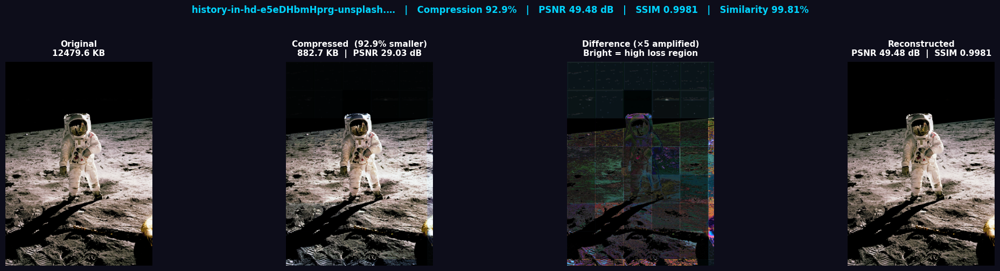

  Figure saved → /content/result_history-in-hd-e5eDHbmHprg-unsplash.png

▶  nasa--hI5dX2ObAs-unsplash.jpg
  Original size       : 15519.07 KB
  Compressed size     : 714.70 KB
  Compression %       : 95.39 %
  PSNR (compressed)   : 26.30 dB
  PSNR (reconstructed): 48.82 dB
  SSIM (reconstructed): 0.9958
  Similarity          : 99.58 %


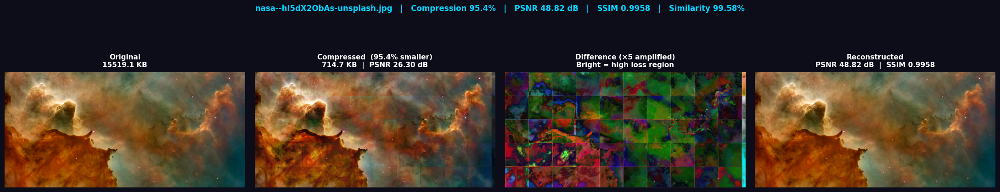

  Figure saved → /content/result_nasa--hI5dX2ObAs-unsplash.png

▶  nasa-U2uKrI4lci8-unsplash.jpg
  Original size       : 15422.62 KB
  Compressed size     : 885.83 KB
  Compression %       : 94.26 %
  PSNR (compressed)   : 26.19 dB
  PSNR (reconstructed): 47.72 dB
  SSIM (reconstructed): 0.9933
  Similarity          : 99.33 %


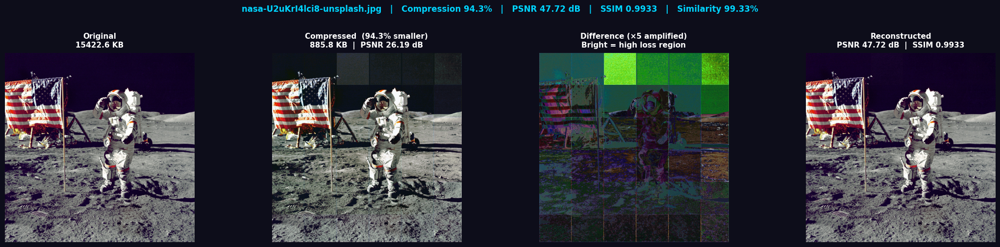

  Figure saved → /content/result_nasa-U2uKrI4lci8-unsplash.png

▶  nasa-rTZW4f02zY8-unsplash.jpg
  Original size       : 79123.19 KB
  Compressed size     : 3937.33 KB
  Compression %       : 95.02 %
  PSNR (compressed)   : 25.44 dB
  PSNR (reconstructed): 48.80 dB
  SSIM (reconstructed): 0.9957
  Similarity          : 99.57 %


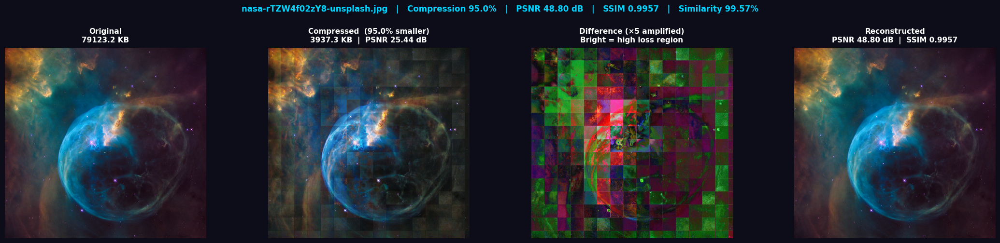

  Figure saved → /content/result_nasa-rTZW4f02zY8-unsplash.png

▶  nasa-yZygONrUBe8-unsplash.jpg
  Original size       : 15365.60 KB
  Compressed size     : 960.24 KB
  Compression %       : 93.75 %
  PSNR (compressed)   : 27.28 dB
  PSNR (reconstructed): 50.05 dB
  SSIM (reconstructed): 0.9962
  Similarity          : 99.62 %


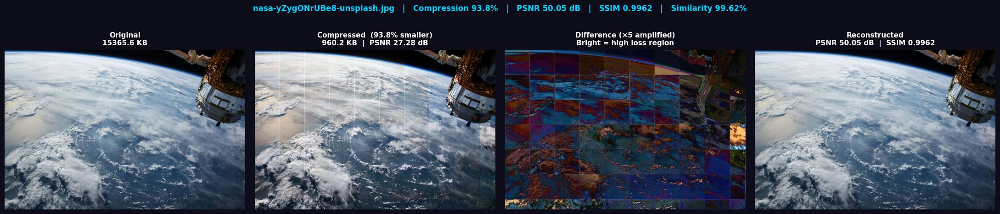

  Figure saved → /content/result_nasa-yZygONrUBe8-unsplash.png

▶  shot-by-cerqueira-Oo_GEzyargo-unsplash.jpg
  ✗ Cannot read: /content/shot-by-cerqueira-Oo_GEzyargo-unsplash.jpg

════════════════════════════════════════════════════════════════════════════════
  Image                                       Comp%     PSNR    SSIM   Simil%
────────────────────────────────────────────────────────────────────────────────
  history-in-hd-e5eDHbmHprg-unsplash.jpg      92.9%   49.48dB  0.9981   99.81%
  nasa--hI5dX2ObAs-unsplash.jpg               95.4%   48.82dB  0.9958   99.58%
  nasa-U2uKrI4lci8-unsplash.jpg               94.3%   47.72dB  0.9933   99.33%
  nasa-rTZW4f02zY8-unsplash.jpg               95.0%   48.80dB  0.9957   99.57%
  nasa-yZygONrUBe8-unsplash.jpg               93.8%   50.05dB  0.9962   99.62%
────────────────────────────────────────────────────────────────────────────────
  AVERAGE                                     94.3%   48.97dB  0.9958   99.58%
═════════════════════════

In [7]:
# ============================================================
#  External Image Test — Compression + Reconstruction Pipeline
#  Tests: 6 custom images
#  Output per image: Compression%, PSNR, SSIM, Similarity
#  Visual: Original | Compressed | Difference | Reconstructed
# ============================================================

import os, cv2, random
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F
import torchvision.transforms as T
from skimage.metrics import peak_signal_noise_ratio as psnr_metric
from skimage.metrics import structural_similarity as ssim_metric

# ── Image paths ──────────────────────────────────────────────
TEST_IMAGES = [
    "/content/history-in-hd-e5eDHbmHprg-unsplash.jpg",
    "/content/nasa--hI5dX2ObAs-unsplash.jpg",
    "/content/nasa-U2uKrI4lci8-unsplash.jpg",
    "/content/nasa-rTZW4f02zY8-unsplash.jpg",
    "/content/nasa-yZygONrUBe8-unsplash.jpg",
    "/content/shot-by-cerqueira-Oo_GEzyargo-unsplash.jpg",
]

PATCH_SIZE  = 512     # process in tiles to avoid OOM on large images
JPEG_Q      = 42      # same quality used during compression training
TEMP_ORIG   = "/content/_tmp_orig.png"
TEMP_COMP   = "/content/_tmp_comp.jpg"


# ── Helper: run one image through both models ─────────────────
def run_pipeline(image_path, comp_model, recon_model, device, patch_size=512):
    img_bgr = cv2.imread(image_path)
    if img_bgr is None:
        print(f"  ✗ Cannot read: {image_path}")
        return None, None, None

    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    orig    = img_rgb.copy()
    h, w    = orig.shape[:2]

    comp_full  = np.zeros_like(orig, dtype=np.float32)
    recon_full = np.zeros_like(orig, dtype=np.float32)

    comp_model.eval(); recon_model.eval()

    for i in range(0, h, patch_size):
        for j in range(0, w, patch_size):
            h0, h1 = i, min(i + patch_size, h)
            w0, w1 = j, min(j + patch_size, w)
            patch  = img_rgb[h0:h1, w0:w1]
            ph, pw = patch.shape[:2]

            # Pad to patch_size
            pad = np.zeros((patch_size, patch_size, 3), dtype=np.uint8)
            pad[:ph, :pw] = patch
            t = T.ToTensor()(pad).unsqueeze(0).to(device)

            with torch.no_grad():
                comp_t, imp_t, _ = comp_model(t, training=False)

                # Fix importance size mismatch
                if imp_t.shape[2:] != comp_t.shape[2:]:
                    imp_t = F.interpolate(imp_t, size=comp_t.shape[2:],
                                          mode='bilinear', align_corners=False)

                diff_t = t - comp_t
                rec_t  = recon_model(comp_t, imp_t, diff_t)

            comp_full[h0:h1, w0:w1]  = comp_t[0].cpu().permute(1,2,0).numpy()[:ph,:pw]
            recon_full[h0:h1, w0:w1] = rec_t[0].cpu().permute(1,2,0).numpy()[:ph,:pw]

    comp_np  = (comp_full  * 255).clip(0, 255).astype(np.uint8)
    recon_np = (recon_full * 255).clip(0, 255).astype(np.uint8)
    return orig, comp_np, recon_np


# ── Helper: compute all metrics ───────────────────────────────
def compute_metrics(orig, comp_np, recon_np):
    o  = orig.astype(np.float32)  / 255.
    c  = comp_np.astype(np.float32)  / 255.
    r  = recon_np.astype(np.float32) / 255.

    psnr_comp  = psnr_metric(o, c, data_range=1.0)
    psnr_recon = psnr_metric(o, r, data_range=1.0)
    ssim_comp  = ssim_metric(o, c, channel_axis=2, data_range=1.0)
    ssim_recon = ssim_metric(o, r, channel_axis=2, data_range=1.0)

    # File-size compression % (save orig as PNG, comp as JPEG)
    cv2.imwrite(TEMP_ORIG, cv2.cvtColor(orig,     cv2.COLOR_RGB2BGR))
    cv2.imwrite(TEMP_COMP, cv2.cvtColor(comp_np,  cv2.COLOR_RGB2BGR),
                [cv2.IMWRITE_JPEG_QUALITY, JPEG_Q])
    orig_kb   = os.path.getsize(TEMP_ORIG) / 1024
    comp_kb   = os.path.getsize(TEMP_COMP) / 1024
    comp_pct  = (1 - comp_kb / orig_kb) * 100

    return {
        "orig_kb"    : orig_kb,
        "comp_kb"    : comp_kb,
        "comp_pct"   : comp_pct,
        "psnr_comp"  : psnr_comp,
        "psnr_recon" : psnr_recon,
        "ssim_comp"  : ssim_comp,
        "ssim_recon" : ssim_recon,
        "similarity" : ssim_recon * 100,
    }


# ── Helper: 4-panel figure ────────────────────────────────────
def plot_results(orig, comp_np, recon_np, metrics, title, save_path):
    diff_vis = np.abs(orig.astype(np.float32) - comp_np.astype(np.float32))
    diff_vis = (diff_vis * 5).clip(0, 255).astype(np.uint8)

    fig, axes = plt.subplots(1, 4, figsize=(22, 5))
    fig.patch.set_facecolor('#0d0d1a')
    for ax in axes:
        ax.set_facecolor('#0d0d1a')

    tk = dict(color='white', fontsize=11, fontweight='bold', pad=8)

    axes[0].imshow(orig)
    axes[0].set_title(f"Original\n{metrics['orig_kb']:.1f} KB", **tk)
    axes[0].axis('off')

    axes[1].imshow(comp_np)
    axes[1].set_title(
        f"Compressed  ({metrics['comp_pct']:.1f}% smaller)\n"
        f"{metrics['comp_kb']:.1f} KB  |  PSNR {metrics['psnr_comp']:.2f} dB", **tk)
    axes[1].axis('off')

    axes[2].imshow(diff_vis)
    axes[2].set_title("Difference (×5 amplified)\nBright = high loss region", **tk)
    axes[2].axis('off')

    axes[3].imshow(recon_np)
    axes[3].set_title(
        f"Reconstructed\n"
        f"PSNR {metrics['psnr_recon']:.2f} dB  |  SSIM {metrics['ssim_recon']:.4f}", **tk)
    axes[3].axis('off')

    fig.suptitle(
        f"{title}   |   Compression {metrics['comp_pct']:.1f}%   |   "
        f"PSNR {metrics['psnr_recon']:.2f} dB   |   "
        f"SSIM {metrics['ssim_recon']:.4f}   |   "
        f"Similarity {metrics['similarity']:.2f}%",
        color='#00d4ff', fontsize=12, fontweight='bold', y=1.01
    )
    plt.tight_layout(pad=1.5)
    plt.savefig(save_path, dpi=130, bbox_inches='tight',
                facecolor=fig.get_facecolor())
    plt.show()
    print(f"  Figure saved → {save_path}")


# ── Main test loop ────────────────────────────────────────────

print("═"*60)
print("   EXTERNAL IMAGE TEST — Compression + Reconstruction")
print("═"*60)

all_metrics = []

for img_path in TEST_IMAGES:
    name  = os.path.basename(img_path)
    short = name[:35] + "…" if len(name) > 35 else name
    print(f"\n▶  {name}")

    orig, comp_np, recon_np = run_pipeline(
        img_path, model, recon_model, device, PATCH_SIZE)

    if orig is None:
        continue

    m = compute_metrics(orig, comp_np, recon_np)
    all_metrics.append({**m, "name": name})

    # ── Print per-image results ───────────────────────────────
    print(f"  {'Original size':<20}: {m['orig_kb']:.2f} KB")
    print(f"  {'Compressed size':<20}: {m['comp_kb']:.2f} KB")
    print(f"  {'Compression %':<20}: {m['comp_pct']:.2f} %")
    print(f"  {'PSNR (compressed)':<20}: {m['psnr_comp']:.2f} dB")
    print(f"  {'PSNR (reconstructed)':<20}: {m['psnr_recon']:.2f} dB")
    print(f"  {'SSIM (reconstructed)':<20}: {m['ssim_recon']:.4f}")
    print(f"  {'Similarity':<20}: {m['similarity']:.2f} %")

    save_fig = f"/content/result_{os.path.splitext(name)[0]}.png"
    plot_results(orig, comp_np, recon_np, m, short, save_fig)


# ── Summary table ─────────────────────────────────────────────
print("\n" + "═"*80)
print(f"  {'Image':<42} {'Comp%':>6}  {'PSNR':>7}  {'SSIM':>6}  {'Simil%':>7}")
print("─"*80)
for m in all_metrics:
    n = m['name'][:40]
    print(f"  {n:<42} {m['comp_pct']:>5.1f}%  "
          f"{m['psnr_recon']:>6.2f}dB  {m['ssim_recon']:>6.4f}  "
          f"{m['similarity']:>6.2f}%")
print("─"*80)

avg_comp  = np.mean([m['comp_pct']   for m in all_metrics])
avg_psnr  = np.mean([m['psnr_recon'] for m in all_metrics])
avg_ssim  = np.mean([m['ssim_recon'] for m in all_metrics])
avg_simil = np.mean([m['similarity'] for m in all_metrics])

print(f"  {'AVERAGE':<42} {avg_comp:>5.1f}%  "
      f"{avg_psnr:>6.2f}dB  {avg_ssim:>6.4f}  {avg_simil:>6.2f}%")
print("═"*80)